In [2]:
library(Seurat)
library(Matrix)
library(cowplot)
library(dplyr)
library(clustree)
library(DT)
library(pheatmap)
library(RColorBrewer)
library(gplots)

<h2>1.Loading Data</h2>

In [3]:
data_name <- c("CL1-0-P-4", "CL1-0-100-4", "CL1-0-D100-7","CL1-0-D100-14" , 
               "CL1-5-P-4", "CL1-5-100-4", "CL1-5-D100-7" ,"CL1-5-D100-14", 
               "CLS1-P-4", "CLS1-100-4", "CLS1-D100-7", "CLS1-D100-14")
# data_dir <-c('/mnt/isilonX200/scRNA/Project_1/GRCh38_20200320/CL1-0-100-4/outs/filtered_gene_bc_matrices/')
data_dir <- c()
for (i in c(1:length(data_name))){
    append_dir <- paste0("/mnt/isilonX200/scRNA/Project_1/GRCh38_20200320/", data_name[i], 
                         "/outs/filtered_feature_bc_matrix/")
    data_dir <- c(data_dir, append_dir)
}
#5-Asa2
LABEL <- c("CL1-0-P", "CL1-0-D4", "CL1-0-D7","CL1-0-D14" , 
           "CL1-5-P", "CL1-5-D4", "CL1-5-D7" ,"CL1-5-D14", 
           "CLS1-P", "CLS1-D4", "CLS1-D7", "CLS1-D14")

sc_list = list()

In [4]:
for(i in 1:12){
data <- Read10X(data.dir = data_dir[i])
colnames(data) <- paste(colnames(data),i,sep="-")
sc.data <- CreateSeuratObject(counts= data, project = "Project_1", min.cells = 5)#移除只有5個細胞偵測到的gene
sc.data@meta.data$stim <- LABEL[i]
#calculate mitochondria rate
sc.data[["percent.mt"]] <- PercentageFeatureSet(sc.data, pattern = "^MT-",assay = "RNA")
sc.data <- subset(sc.data, subset = percent.mt <= 10)
sc.data <- subset(sc.data, subset = nFeature_RNA > 500)
sc.data <- NormalizeData(object = sc.data, verbose = FALSE) #Normalize
sc.data <- FindVariableFeatures(object = sc.data, selection.method = "vst", nfeatures = 2000, verbose = FALSE)
sc_list[[i]] <- ScaleData(object = sc.data) 
}

Centering and scaling data matrix

Centering and scaling data matrix

Centering and scaling data matrix

Centering and scaling data matrix

Centering and scaling data matrix

Centering and scaling data matrix

Centering and scaling data matrix

Centering and scaling data matrix

Centering and scaling data matrix

Centering and scaling data matrix

Centering and scaling data matrix

Centering and scaling data matrix



<h2>2.Integrate</h2>

In [5]:
sc.features <- SelectIntegrationFeatures(object.list = sc_list, nfeatures = 2000, selection.method = "vst")
anchors <- FindIntegrationAnchors(object.list = sc_list, dims = 1:20, anchor.features=sc.features, reference=1)
project1_integrated <- IntegrateData(anchorset = anchors, dims = 1:20) 

Scaling features for provided objects

Finding anchors between all query and reference datasets

Running CCA

Merging objects

Finding neighborhoods

Finding anchors

	Found 10606 anchors

Filtering anchors

	Retained 8019 anchors

Extracting within-dataset neighbors

Running CCA

Merging objects

Finding neighborhoods

Finding anchors

	Found 9563 anchors

Filtering anchors

	Retained 5077 anchors

Extracting within-dataset neighbors

Running CCA

Merging objects

Finding neighborhoods

Finding anchors

	Found 10594 anchors

Filtering anchors

	Retained 6440 anchors

Extracting within-dataset neighbors

Running CCA

Merging objects

Finding neighborhoods

Finding anchors

	Found 12603 anchors

Filtering anchors

	Retained 3005 anchors

Extracting within-dataset neighbors

Running CCA

Merging objects

Finding neighborhoods

Finding anchors

	Found 11897 anchors

Filtering anchors

	Retained 3059 anchors

Extracting within-dataset neighbors

Running CCA

Merging objects

Finding neighb

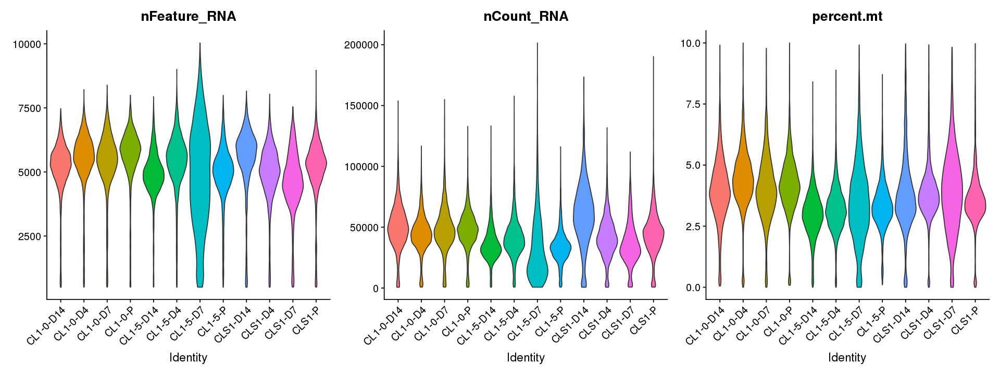

In [25]:
options(repr.plot.width=16, repr.plot.height=6)
VlnPlot(project1_integrated, features = c("nFeature_RNA", "nCount_RNA", "percent.mt"), 
        ncol = 3, group.by = "stim", pt.size = 0, assay = "integrated" )

In [28]:
# Full Seurat Data
project1_integrated[[]]

,orig.ident,nCount_RNA,nFeature_RNA,stim,percent.mt
,<chr>,<dbl>,<int>,<chr>,<dbl>
AAACCTGAGGATATAC-1,Project_1,34902,5159,CL1-0-P,6.8907226
AAACCTGAGGGTCTCC-1,Project_1,57950,6302,CL1-0-P,4.8800690
AAACCTGCAAGCCTAT-1,Project_1,28025,4588,CL1-0-P,4.1570027
AAACCTGCACAGTCGC-1,Project_1,44234,5269,CL1-0-P,3.7595515
AAACCTGCACATTTCT-1,Project_1,50946,5665,CL1-0-P,3.2328348
AAACCTGGTTAAAGAC-1,Project_1,48819,5701,CL1-0-P,4.3630554
AAACGGGGTCCCTACT-1,Project_1,57221,6409,CL1-0-P,2.8555950
AAACGGGTCACCATAG-1,Project_1,60750,6441,CL1-0-P,3.9325103
AAACGGGTCAGCACAT-1,Project_1,58969,6347,CL1-0-P,3.6375045


In [30]:
#Cell 數量
project1_integrated[[]] %>% group_by(stim) %>% summarise(cell_count = length(nCount_RNA))

stim,cell_count
<chr>,<int>
CL1-0-D14,4082
CL1-0-D4,3754
CL1-0-D7,3138
CL1-0-P,3469
CL1-5-D14,5339
CL1-5-D4,3979
CL1-5-D7,3094
CL1-5-P,4607
CLS1-D14,2465


<h2>3.Feature Selection</h2>

In [31]:
project1_integrated <- FindVariableFeatures(project1_integrated, selection.method = "vst", nfeatures = 2000)

Warning message in FindVariableFeatures.Assay(object = assay.data, selection.method = selection.method, :
"selection.method set to 'vst' but count slot is empty; will use data slot instead"
Warning message in eval(predvars, data, env):
"NaNs produced"
Warning message in hvf.info$variance.expected[not.const] <- 10^fit$fitted:
"number of items to replace is not a multiple of replacement length"


Warning message:
"Using `as.character()` on a quosure is deprecated as of rlang 0.3.0.
Please use `as_label()` or `as_name()` instead.
This warning is displayed once per session."
Warning message in self$trans$transform(x):
"NaNs produced"
Warning message:
"Transformation introduced infinite values in continuous x-axis"
Warning message:
"Removed 17 rows containing missing values (geom_point)."


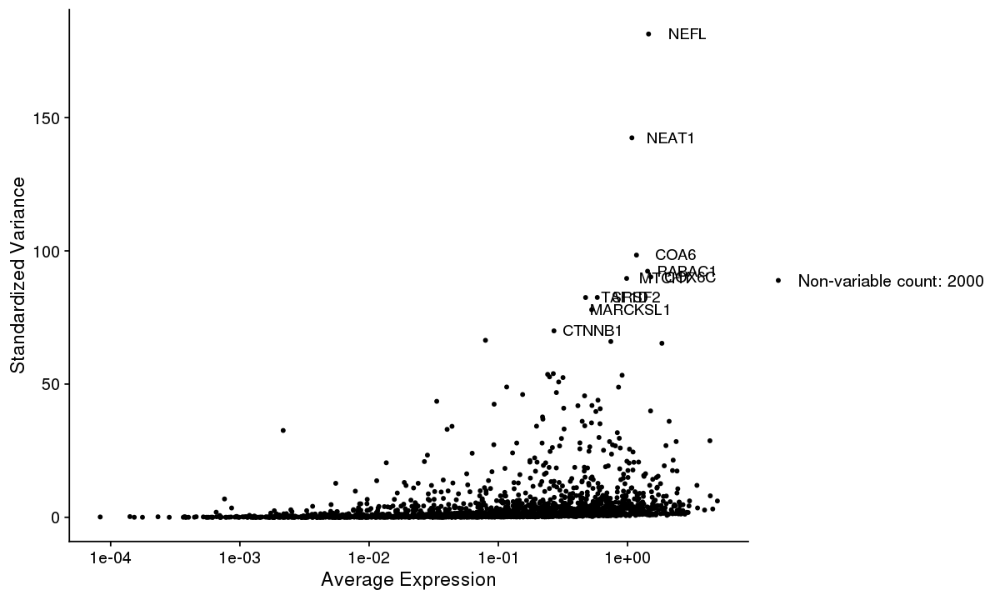

In [34]:
top10<-head(VariableFeatures(project1_integrated),10)
options(repr.plot.width = 10, repr.plot.heigh = 5)
LabelPoints(plot = VariableFeaturePlot(project1_integrated), points=top10)

In [103]:
length(rownames(project1_integrated[[]]))

[1] 43633

<h2>4.PCA</h2>

In [40]:
DefaultAssay(object = project1_integrated) <- "integrated"
options(repr.plot.width=8, repr.plot.height=8)
resolutions <- seq(0, 1, 0.1)
# Run the standard workflow for visualization and clustering
project1_integrated <- ScaleData(object = project1_integrated, verbose = FALSE)
project1_integrated <- RunPCA(object = project1_integrated, npcs = 100, verbose = FALSE)

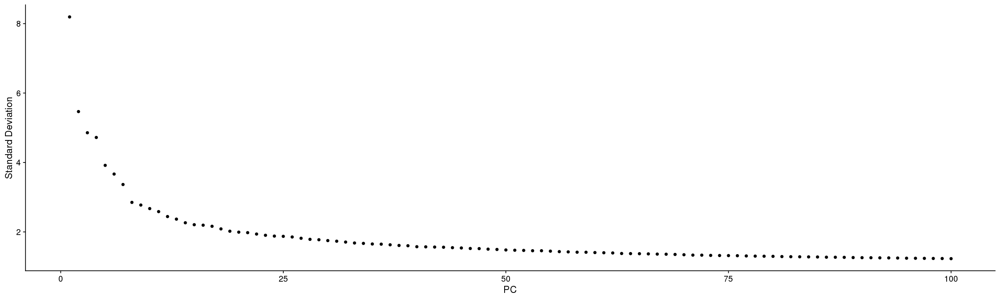

In [41]:
options(repr.plot.width=20, repr.plot.height=6)
ElbowPlot(project1_integrated, ndims = 100, reduction = "pca")

Warning message:
"Removed 140000 rows containing missing values (geom_point)."


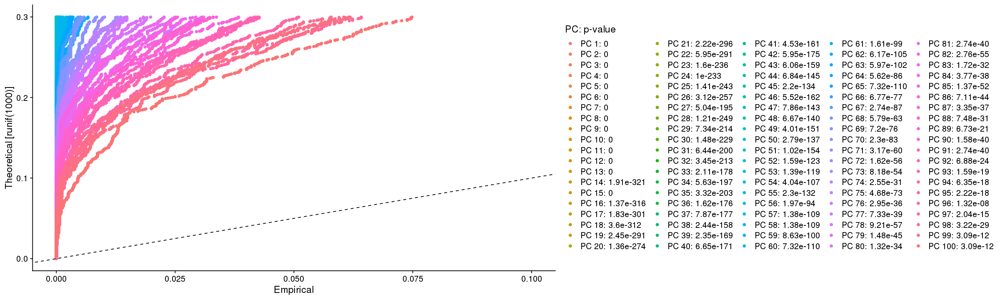

In [46]:
library(future)
plan("multiprocess", workers = 12)
project1_integrated <- JackStraw(project1_integrated, num.replicate = 300, dims = 100)
project1_integrated <- ScoreJackStraw(project1_integrated, dims = 1:100)
JackStrawPlot(project1_integrated, dims = 1:100)

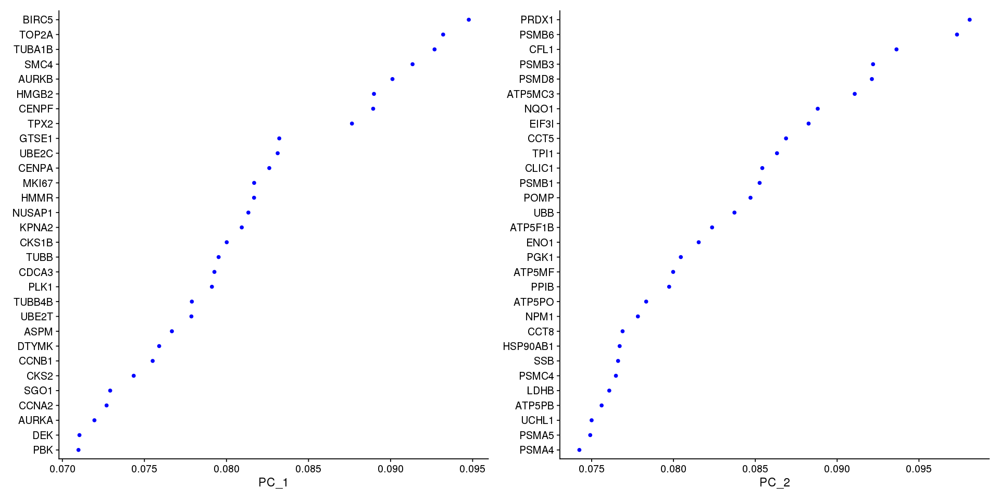

In [106]:
VizDimLoadings(object = project1_integrated, dims = 1:2, reduction = 'pca')

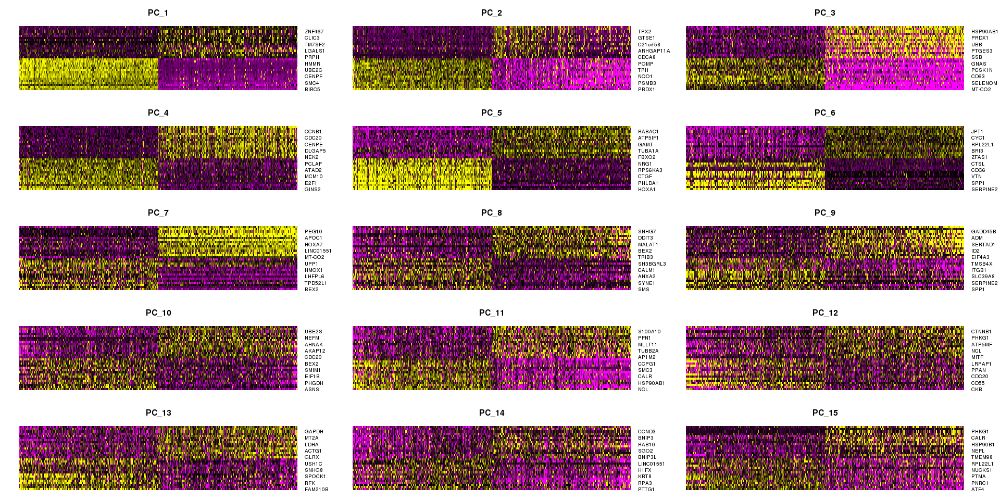

In [108]:
DimHeatmap(project1_integrated, dims = 1:15, cells = 1000, balanced = TRUE)

<h2>5.Cluster</h2>

In [47]:
project1_integrated <- FindNeighbors(object = project1_integrated, reduction = "pca", dims = 1:100)
project1_integrated <- FindClusters(project1_integrated, resolution = resolutions)

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 43633
Number of edges: 2931085

Running Louvain algorithm...
Maximum modularity in 10 random starts: 1.0000
Number of communities: 16
Elapsed time: 25 seconds


13 singletons identified. 3 final clusters.



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 43633
Number of edges: 2931085

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9278
Number of communities: 22
Elapsed time: 32 seconds


13 singletons identified. 9 final clusters.



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 43633
Number of edges: 2931085

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8967
Number of communities: 26
Elapsed time: 30 seconds


13 singletons identified. 13 final clusters.



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 43633
Number of edges: 2931085

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8781
Number of communities: 28
Elapsed time: 23 seconds


13 singletons identified. 15 final clusters.



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 43633
Number of edges: 2931085

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8617
Number of communities: 30
Elapsed time: 22 seconds


13 singletons identified. 17 final clusters.



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 43633
Number of edges: 2931085

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8471
Number of communities: 33
Elapsed time: 23 seconds


13 singletons identified. 20 final clusters.



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 43633
Number of edges: 2931085

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8352
Number of communities: 34
Elapsed time: 19 seconds


13 singletons identified. 21 final clusters.



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 43633
Number of edges: 2931085

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8232
Number of communities: 34
Elapsed time: 29 seconds


13 singletons identified. 21 final clusters.



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 43633
Number of edges: 2931085

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8122
Number of communities: 35
Elapsed time: 21 seconds


13 singletons identified. 22 final clusters.



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 43633
Number of edges: 2931085

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8026
Number of communities: 36
Elapsed time: 19 seconds


13 singletons identified. 23 final clusters.



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 43633
Number of edges: 2931085

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.7934
Number of communities: 37
Elapsed time: 21 seconds


13 singletons identified. 24 final clusters.



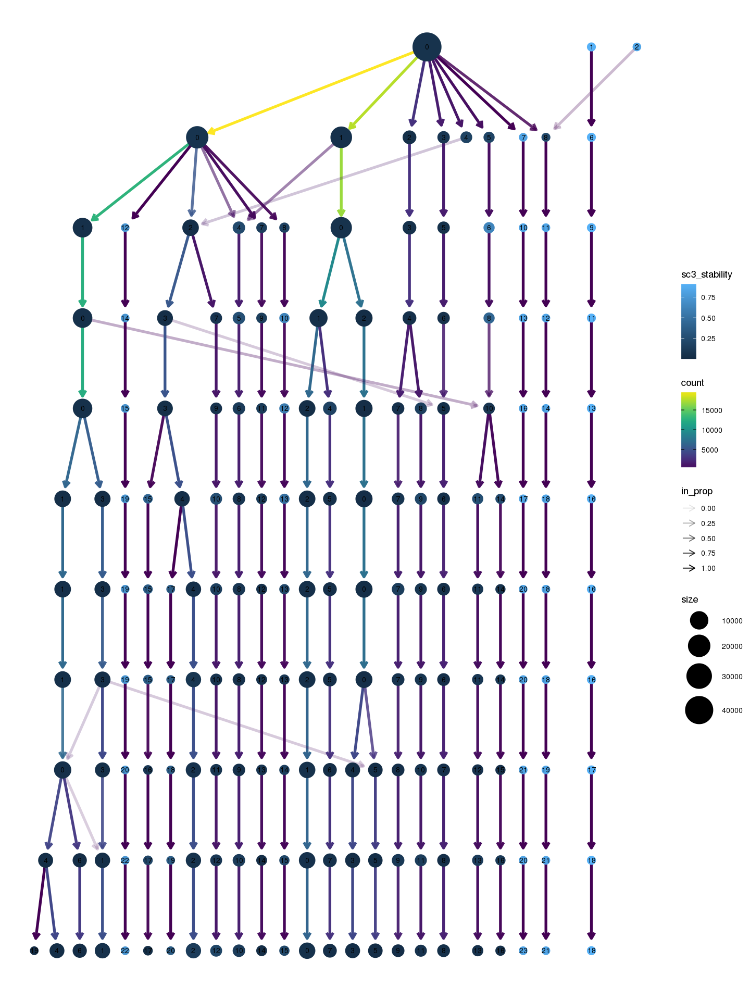

In [48]:
options(repr.plot.width=12, repr.plot.height=16)
clustree(project1_integrated, node_colour = "sc3_stability")

In [49]:
zz<-clustree:::calc_sc3_stability(project1_integrated[[]][,6:16])
data.frame(zz) %>% group_by(resolution) %>% summarise(mean(stability),sd(stability)/mean(stability))

resolution,mean(stability),sd(stability)/mean(stability)
<dbl>,<dbl>,<dbl>
1,0.6014534,0.7819863
2,0.2854333,1.1755978
3,0.3620385,0.9879608
4,0.3379249,1.0283304
5,0.2822191,1.1854754
6,0.2845045,1.0811750
7,0.2454582,1.2395409
8,0.2324120,1.3303895
9,0.2093359,1.4606673


In [51]:
# UMAP & TSNE
DefaultAssay(object = project1_integrated) <- "integrated"
project1_integrated <- RunUMAP(object = project1_integrated, reduction = "pca", dims = 1:100)
project1_integrated <- RunTSNE(project1_integrated, reduction = "pca", dims = 1:100, max_iter=2000)

17:27:35 UMAP embedding parameters a = 0.9922 b = 1.112

17:27:36 Read 43633 rows and found 100 numeric columns

17:27:36 Using Annoy for neighbor search, n_neighbors = 30

17:27:36 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*

|

17:27:48 Writing NN index file to temp file /tmp/RtmpSTSMB2/file25a3275ce9b02

17:27:48 Searching Annoy index using 12 threads, search_k = 3000

17:27:54 Annoy recall = 100%

17:27:54 Commencing smooth kNN distance calibration using 12 threads

17:27:57 Initializing from normalized Laplacian + noise

17:27:58 Commencing optimization for 200 epochs, with 2111528 positive edges

17:28:55 Optimization finished



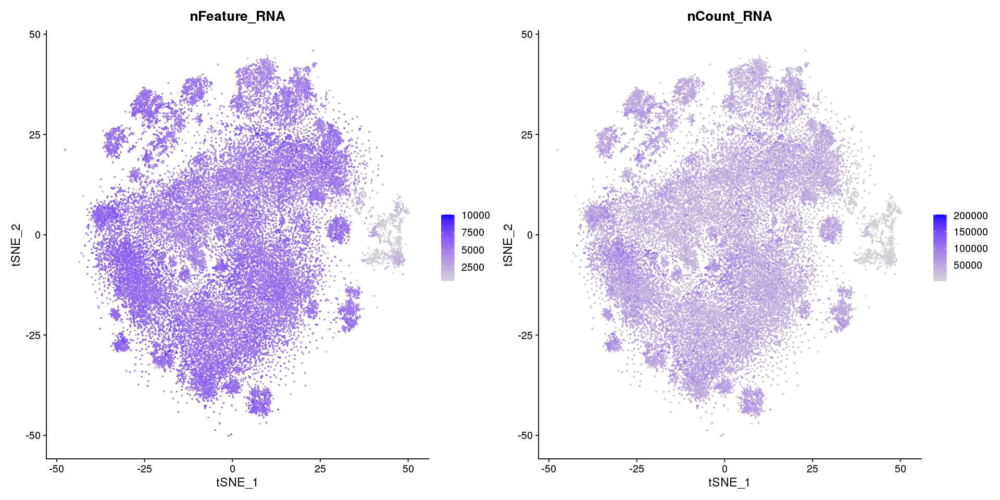

In [52]:
options(repr.plot.width=16, repr.plot.height=8)
FeaturePlot(project1_integrated, features = c("nFeature_RNA", "nCount_RNA"), pt.size = 0.25, reduction = "tsne")

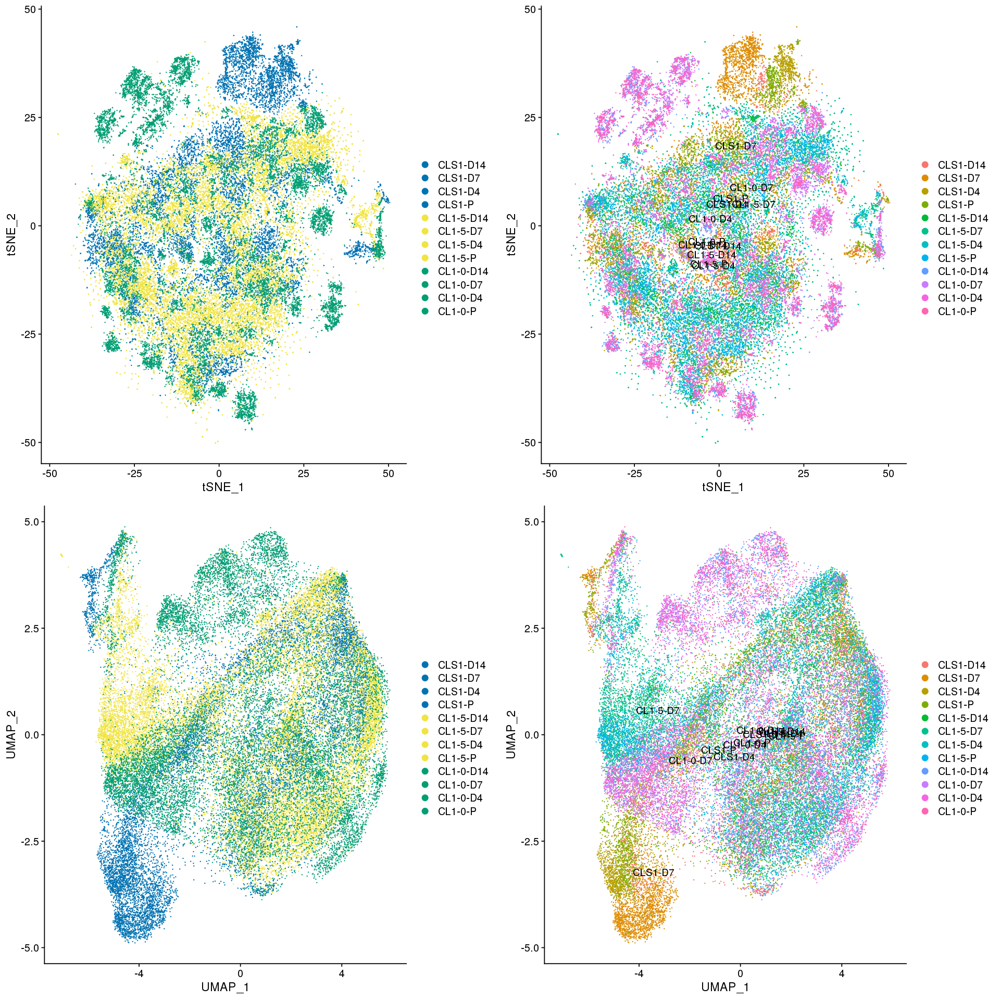

In [83]:
# Visualization
options(repr.plot.width=16, repr.plot.height=16)
p1 <- DimPlot(object = project1_integrated, reduction = "tsne", group.by = "stim",order = LABEL, cols = c("CL1-0-P"="#009E73","CL1-0-D4"="#009E73","CL1-0-D7"="#009E73","CL1-0-D14"="#009E73","CL1-5-P"="#F0E442","CL1-5-D4"="#F0E442","CL1-5-D7"="#F0E442","CL1-5-D14"="#F0E442","CLS1-P"="#0072B2","CLS1-D4"="#0072B2","CLS1-D7"="#0072B2","CLS1-D14"="#0072B2"))#+scale_fill_manual(values=c("#009E73", "#F0E442", "#0072B2", "#D55E00"))
p2 <- DimPlot(object = project1_integrated, reduction = "tsne", label = TRUE, group.by = "stim", order = LABEL)
p3 <- DimPlot(object = project1_integrated, reduction = "umap", group.by = "stim",order = LABEL, cols = c("CL1-0-P"="#009E73","CL1-0-D4"="#009E73","CL1-0-D7"="#009E73","CL1-0-D14"="#009E73","CL1-5-P"="#F0E442","CL1-5-D4"="#F0E442","CL1-5-D7"="#F0E442","CL1-5-D14"="#F0E442","CLS1-P"="#0072B2","CLS1-D4"="#0072B2","CLS1-D7"="#0072B2","CLS1-D14"="#0072B2"))#+scale_fill_manual(values=c("#009E73", "#F0E442", "#0072B2", "#D55E00"))
p4 <- DimPlot(object = project1_integrated, reduction = "umap", label = TRUE, group.by = "stim", order = LABEL)
plot_grid(p1, p2, p3, p4)

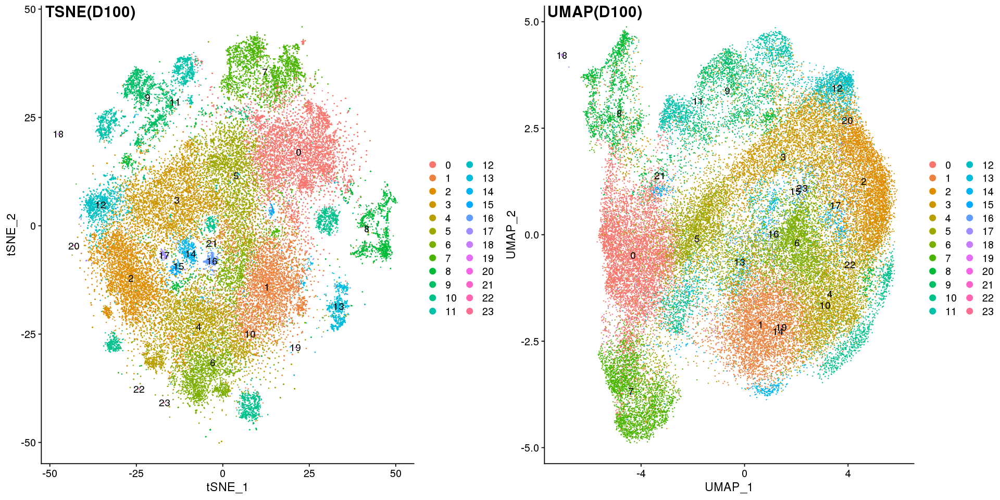

In [64]:
options(repr.plot.width=16, repr.plot.height=8)
p5 <- DimPlot(object = project1_integrated, reduction = "tsne", label = TRUE)
p6 <- DimPlot(object = project1_integrated, reduction = "umap", label = TRUE)
plot_grid(p5, p6 , labels = c("TSNE(D100)","UMAP(D100)"), label_size = 18)

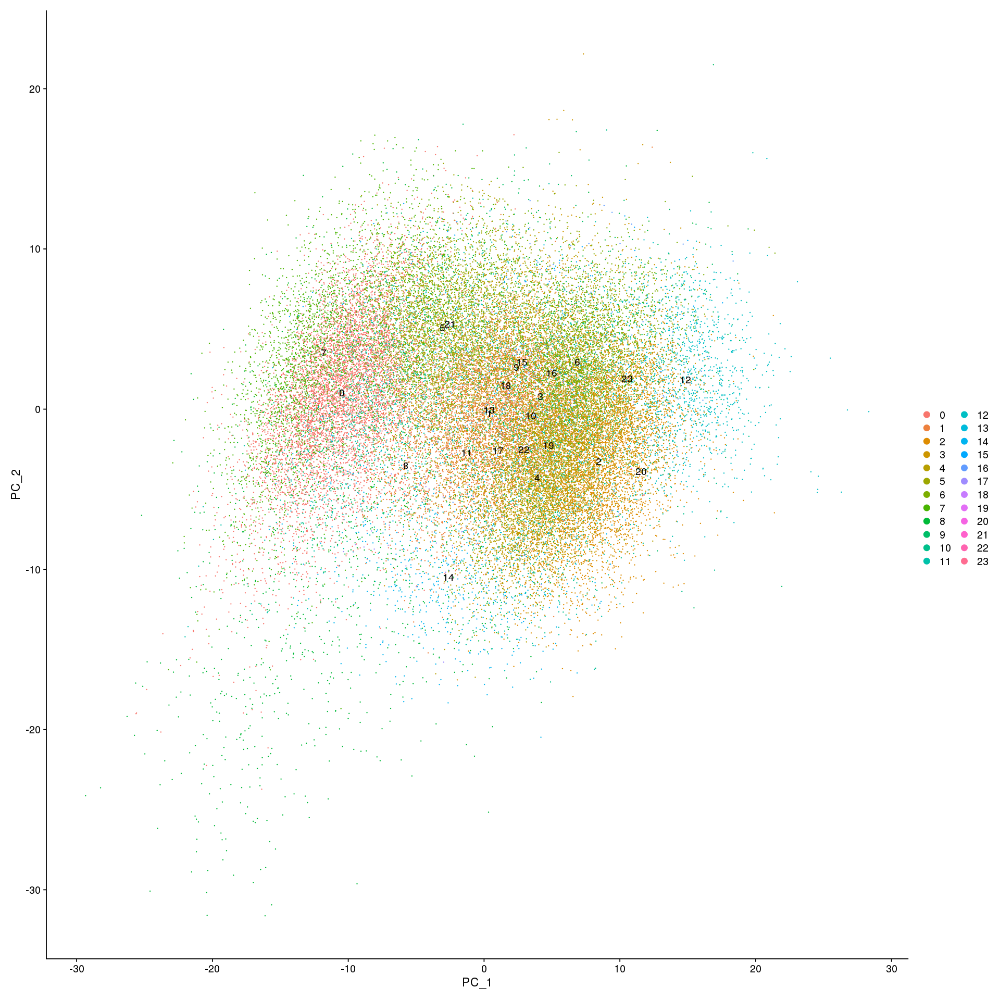

In [87]:
PCAPlot(object = project1_integrated, label = TRUE)

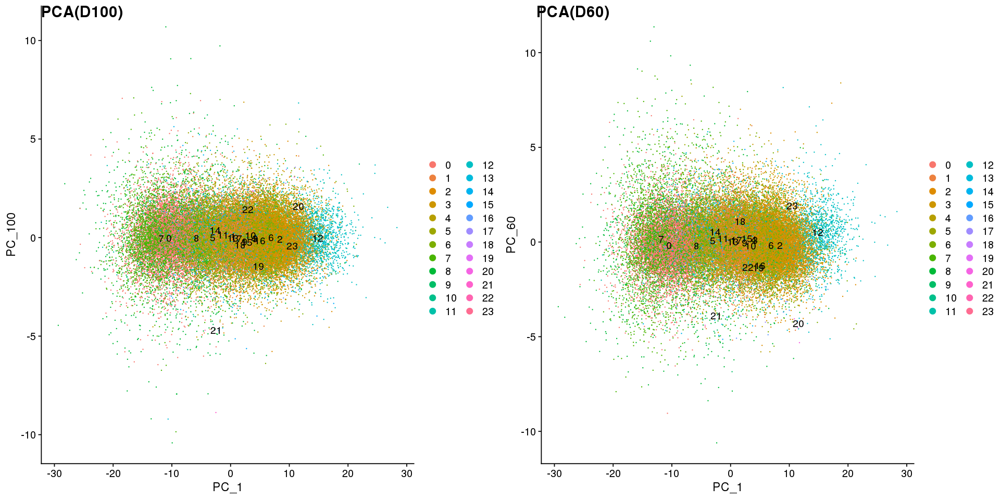

In [78]:
options(repr.plot.width=16, repr.plot.height=8)
p7 <- DimPlot(object = project1_integrated, reduction = "pca", dims = c(1,100), label = TRUE)
p8 <- DimPlot(object = project1_integrated, reduction = "pca", dims =c(1,60), label = TRUE)
plot_grid(p7, p8 , labels = c("PCA(D100)","PCA(D60)"), label_size = 18)

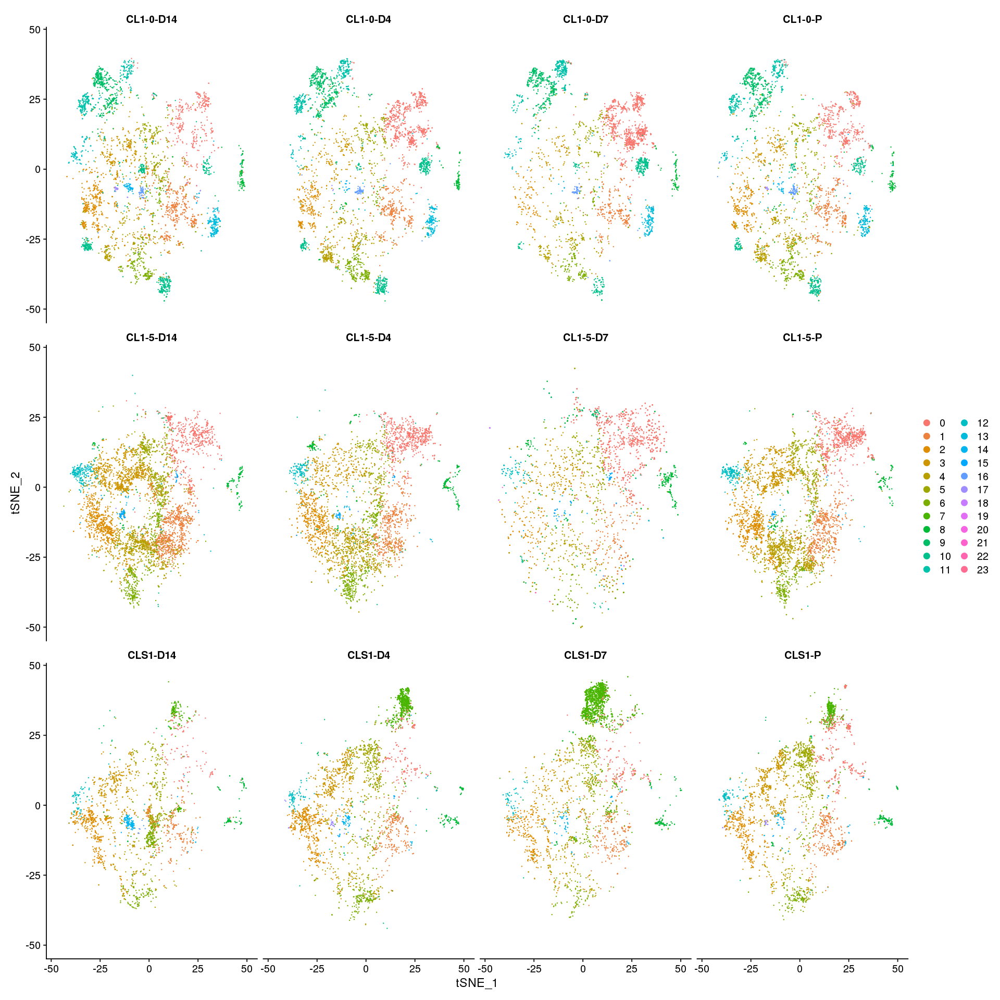

In [56]:
DimPlot(object = project1_integrated, reduction = "tsne", split.by = "stim", ncol = 4)

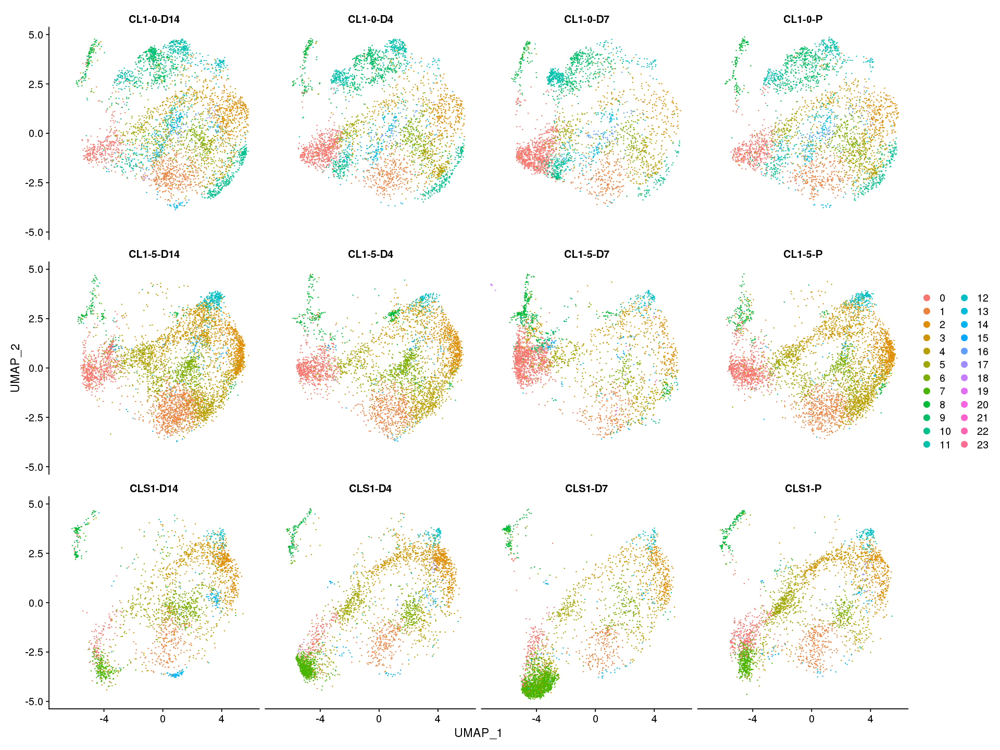

In [54]:
options(repr.plot.width=16, repr.plot.height=12)
DimPlot(object = project1_integrated, reduction = "umap", split.by = "stim", ncol = 4)

In [58]:
# saveRDS(file ="Project1ver2.rds" ,object = project1_integrated)
# project1_integrated <- readRDS(file ="Project1ver2.rds")

In [79]:
# Cluster的成份
plot.data <- project1_integrated@meta.data %>%
    select(stim, cluster = seurat_clusters)%>%
    mutate(cluster = factor(cluster))%>%
    mutate(stim = factor(stim,levels = LABEL))%>%
    group_by(cluster, stim)%>%
    summarise(count = n()) %>%
    mutate(clust_total = sum(count))%>%
    mutate(clust_prop = count / clust_total) %>%
    group_by(stim) %>%
    mutate(dataset_total = sum(count)) %>%
    ungroup() %>%
    mutate(dataset_prop = count / dataset_total)

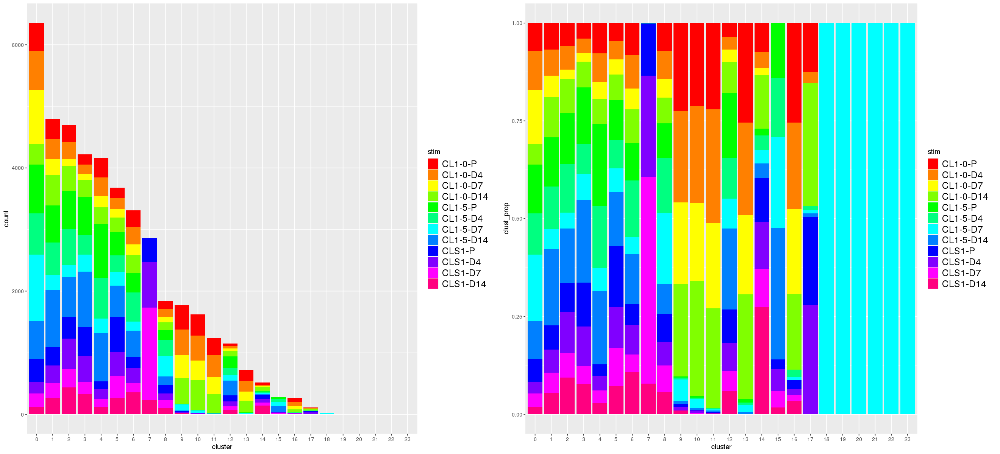

In [80]:
options(repr.plot.width=22, repr.plot.height=10)

gp1<-ggplot(plot.data, aes(x = cluster, y = count, fill = stim)) +
    geom_col()+
    scale_fill_manual(values=rainbow(12))+
    theme(legend.text=element_text(size=15))

gp2<-ggplot(plot.data, aes(x = cluster, y = clust_prop, fill = stim)) +
    geom_col()+
    scale_fill_manual(values=rainbow(12))+
    theme(legend.text=element_text(size=15))
plot_grid(gp1, gp2)

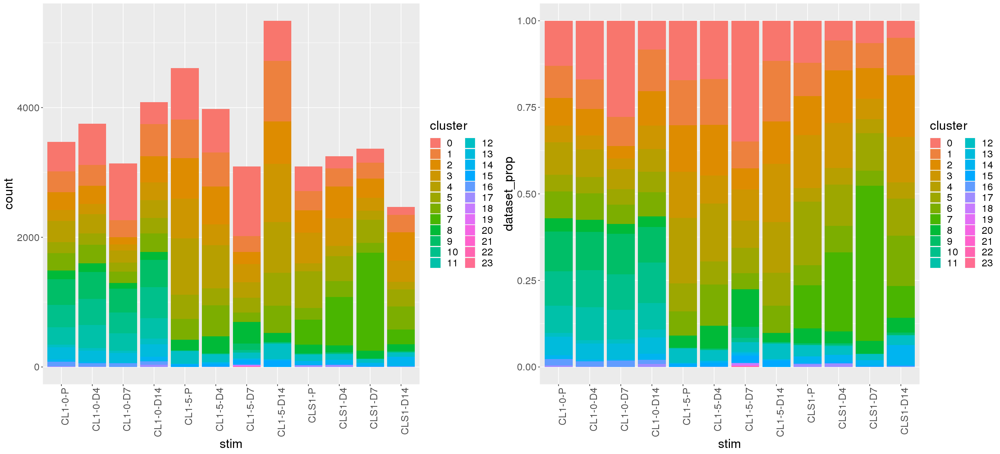

In [89]:
options(repr.plot.width=22, repr.plot.height=10)
gp3<-ggplot(plot.data, aes(x = stim, y = count, fill = cluster)) +
    geom_col()+
    theme(text = element_text(size = 20), axis.text.x = element_text(angle=90, hjust=1))

gp4<-ggplot(plot.data, aes(x = stim, y = dataset_prop, fill = cluster)) +
    geom_col()+
    theme(text = element_text(size = 20), axis.text.x = element_text(angle=90, hjust=1))

plot_grid(gp3, gp4)

In [109]:
# Phylogenetic Analysis of Identity Classes
project1_integrated<-BuildClusterTree(project1_integrated)

Finished averaging integrated for cluster 0

Finished averaging integrated for cluster 1

Finished averaging integrated for cluster 2

Finished averaging integrated for cluster 3

Finished averaging integrated for cluster 4

Finished averaging integrated for cluster 5

Finished averaging integrated for cluster 6

Finished averaging integrated for cluster 7

Finished averaging integrated for cluster 8

Finished averaging integrated for cluster 9

Finished averaging integrated for cluster 10

Finished averaging integrated for cluster 11

Finished averaging integrated for cluster 12

Finished averaging integrated for cluster 13

Finished averaging integrated for cluster 14

Finished averaging integrated for cluster 15

Finished averaging integrated for cluster 16

Finished averaging integrated for cluster 17

Finished averaging integrated for cluster 18

Finished averaging integrated for cluster 19

Finished averaging integrated for cluster 20

Finished averaging integrated for cluster 21


Phylogenetic tree with 24 tips and 23 internal nodes.

Tip labels:
	0, 1, 2, 3, 4, 5, ...

Rooted; includes branch lengths.

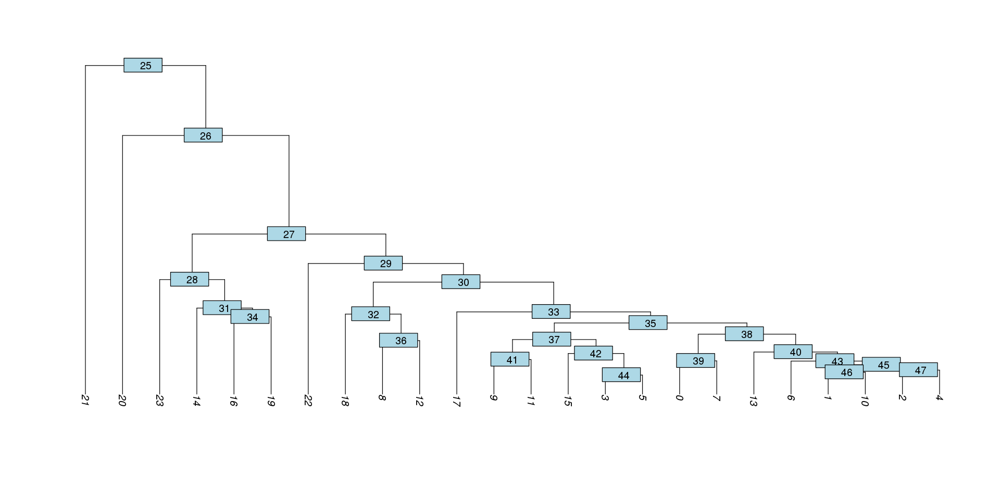

In [111]:
Tool(object = project1_integrated, slot = 'BuildClusterTree')
PlotClusterTree(project1_integrated)

In [93]:
#Dim=>60
project1_integrated2 <- project1_integrated
project1_integrated2 <- FindNeighbors(object = project1_integrated2, reduction = "pca", dims = 1:60)
project1_integrated2 <- FindClusters(project1_integrated2, resolution = resolutions)

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 43633
Number of edges: 1886946

Running Louvain algorithm...
Maximum modularity in 10 random starts: 1.0000
Number of communities: 6
Elapsed time: 14 seconds


5 singletons identified. 1 final clusters.



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 43633
Number of edges: 1886946

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9306
Number of communities: 13
Elapsed time: 16 seconds


5 singletons identified. 8 final clusters.



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 43633
Number of edges: 1886946

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9026
Number of communities: 17
Elapsed time: 15 seconds


5 singletons identified. 12 final clusters.



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 43633
Number of edges: 1886946

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8853
Number of communities: 18
Elapsed time: 19 seconds


5 singletons identified. 13 final clusters.



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 43633
Number of edges: 1886946

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8709
Number of communities: 20
Elapsed time: 17 seconds


5 singletons identified. 15 final clusters.



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 43633
Number of edges: 1886946

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8574
Number of communities: 20
Elapsed time: 18 seconds


5 singletons identified. 15 final clusters.



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 43633
Number of edges: 1886946

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8470
Number of communities: 21
Elapsed time: 17 seconds


5 singletons identified. 16 final clusters.



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 43633
Number of edges: 1886946

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8363
Number of communities: 24
Elapsed time: 21 seconds


5 singletons identified. 19 final clusters.



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 43633
Number of edges: 1886946

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8268
Number of communities: 26
Elapsed time: 19 seconds


5 singletons identified. 21 final clusters.



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 43633
Number of edges: 1886946

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8184
Number of communities: 28
Elapsed time: 17 seconds


5 singletons identified. 23 final clusters.



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 43633
Number of edges: 1886946

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8101
Number of communities: 29
Elapsed time: 20 seconds


5 singletons identified. 24 final clusters.



In [94]:
project1_integrated2 <- RunUMAP(object = project1_integrated2, reduction = "pca", dims = 1:60)
project1_integrated2 <- RunTSNE(project1_integrated2, reduction = "pca", dims = 1:60, max_iter=2000)

03:55:04 UMAP embedding parameters a = 0.9922 b = 1.112

03:55:04 Read 43633 rows and found 60 numeric columns

03:55:04 Using Annoy for neighbor search, n_neighbors = 30

03:55:04 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*

|

03:55:14 Writing NN index file to temp file /tmp/RtmpSTSMB2/file25a326f4db7e4

03:55:14 Searching Annoy index using 12 threads, search_k = 3000

03:55:19 Annoy recall = 100%

03:55:20 Commencing smooth kNN distance calibration using 12 threads

03:55:22 Initializing from normalized Laplacian + noise

03:55:24 Commencing optimization for 200 epochs, with 2060242 positive edges

03:56:22 Optimization finished



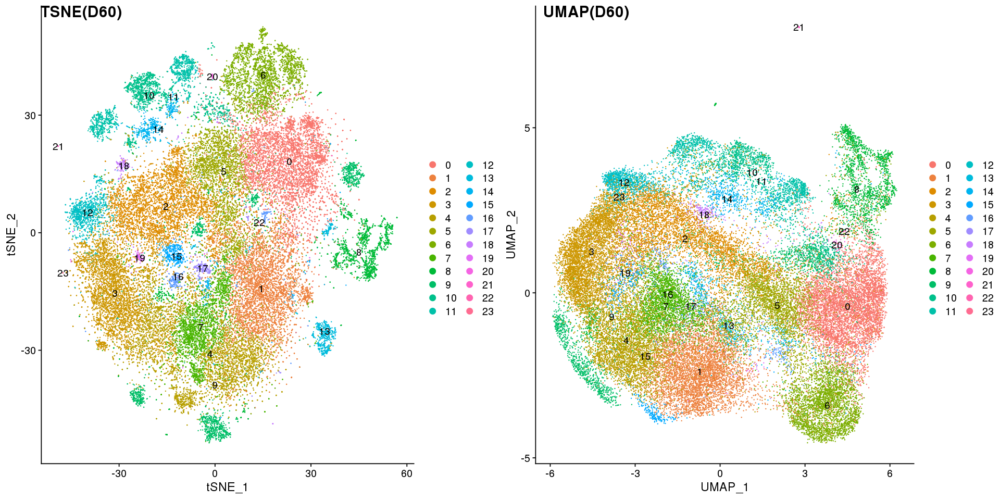

In [95]:
options(repr.plot.width=16, repr.plot.height=8)
p5 <- DimPlot(object = project1_integrated2, reduction = "tsne", label = TRUE)
p6 <- DimPlot(object = project1_integrated2, reduction = "umap", label = TRUE)
plot_grid(p5, p6 , labels = c("TSNE(D60)","UMAP(D60)"), label_size = 18)

<h2>6.Different Expression</h2>

<h2>7.Cell Cycle Analysis</h2>

In [126]:
project1_integrated <- CellCycleScoring(
  object = project1_integrated,
  g2m.features = cc.genes$g2m.genes,
  s.features = cc.genes$s.genes
)

Warning message:
"The following features are not present in the object: MCM2, MCM6, UHRF1, MLF1IP, UBR7, MSH2, RAD51, BLM, CASP8AP2, POLA1, BRIP1, E2F8, not searching for symbol synonyms"
Warning message:
"The following features are not present in the object: FAM64A, HN1, LBR, CTCF, CBX5, not searching for symbol synonyms"


In [128]:
head(project1_integrated[[]], 3)

,orig.ident,nCount_RNA,nFeature_RNA,stim,percent.mt,integrated_snn_res.0,integrated_snn_res.0.1,integrated_snn_res.0.2,integrated_snn_res.0.3,integrated_snn_res.0.4,integrated_snn_res.0.5,integrated_snn_res.0.6,integrated_snn_res.0.7,integrated_snn_res.0.8,integrated_snn_res.0.9,integrated_snn_res.1,seurat_clusters,S.Score,G2M.Score,Phase
,<chr>,<dbl>,<int>,<chr>,<dbl>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<dbl>,<dbl>,<fct>
AAACCTGAGGATATAC-1,Project_1,34902,5159,CL1-0-P,6.890723,0,0,2,3,3,4,4,4,2,4,4,4,-0.05632727,0.100379280,G2M
AAACCTGAGGGTCTCC-1,Project_1,57950,6302,CL1-0-P,4.880069,0,0,4,5,6,8,8,8,9,10,10,10,0.14072086,0.003487199,S
AAACCTGCAAGCCTAT-1,Project_1,28025,4588,CL1-0-P,4.157003,0,1,0,1,2,2,2,2,1,0,0,0,-0.11293489,-0.280752998,G1


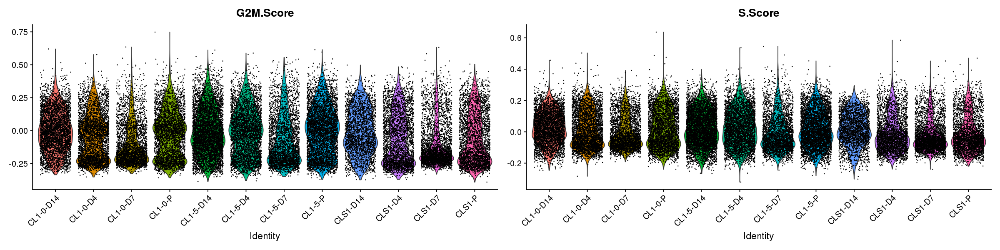

In [137]:
options(repr.plot.width=20, repr.plot.height=5)
VlnPlot(project1_integrated, features = c("G2M.Score","S.Score"), ncol = 2, pt.size = 0.1, group.by="stim")

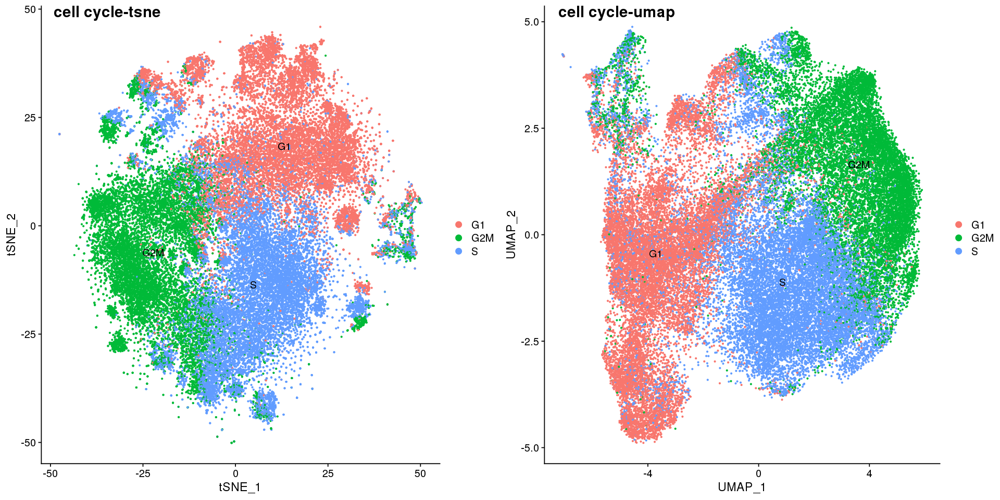

In [142]:
options(repr.plot.width=16, repr.plot.height=8)
ccp1 <- DimPlot(project1_integrated, reduction = "tsne", label = TRUE, group.by = "Phase", pt.size = 0.5)
ccp2 <- DimPlot(project1_integrated, reduction = "umap", label = TRUE, group.by = "Phase", pt.size = 0.5)
plot_grid(ccp1, ccp2, labels = c("cell cycle-tsne","cell cycle-umap"), label_size = 18)

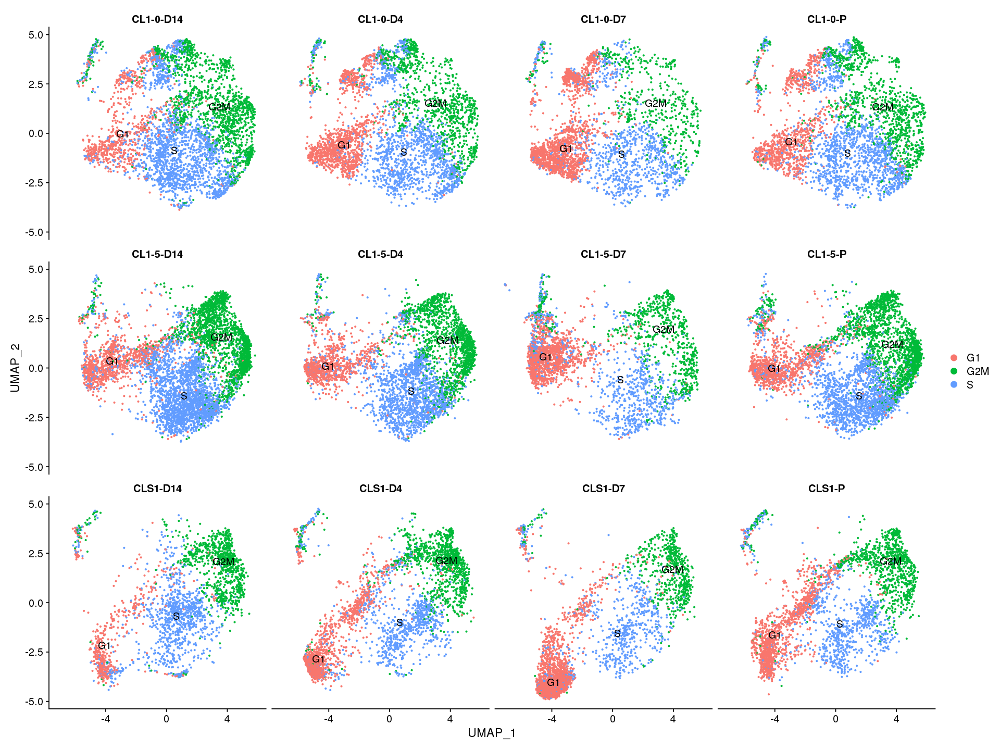

In [144]:
options(repr.plot.width=16, repr.plot.height=12)
DimPlot(project1_integrated, reduction = "umap", label = TRUE, split.by = "stim", group.by = "Phase", pt.size = 0.5, ncol = 4)

ERROR: Error: `data` must be a data frame, or other object coercible by `fortify()`, not an S4 object with class Seurat


In [96]:
?JackStraw

JackStraw {Seurat},R Documentation
object,Seurat object
reduction,DimReduc to use. ONLY PCA CURRENTLY SUPPORTED.
assay,Assay used to calculate reduction.
dims,Number of PCs to compute significance for
num.replicate,Number of replicate samplings to perform
prop.freq,Proportion of the data to randomly permute for each replicate
verbose,Print progress bar showing the number of replicates that have been processed.
maxit,maximum number of iterations to be performed by the irlba function of RunPCA
